In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
import math
import random
import warnings
warnings.filterwarnings("ignore")
plt.style.use("ggplot")


In [ ]:
import pandas as pd

file_path = "/content/drive/MyDrive/Malay_folder/guvi/Crimes_top_600k.csv"

df = pd.read_csv(file_path, low_memory=False)
BASE_PATH = "/content/drive/MyDrive/Malay_folder/guvi/"
RESULTS_PATH = BASE_PATH + "results/"
DATA_PATH = BASE_PATH + "data/"

import os
os.makedirs(RESULTS_PATH, exist_ok=True)
os.makedirs(DATA_PATH, exist_ok=True)

In [ ]:
# Show ALL columns (no truncation)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', 50)  # Optional: limit width per cell

In [ ]:
USE_FULL_KMEANS = False   # If True, run KMeans on full dataset (heavy)
KMEANS_FULL_N = 500000   # when using full, number of rows (should be len(df) usually)
SAMPLE_SIZE = 50000     # sample for plotting / DBSCAN / Hierarchical
HIERARCHICAL_SAMPLE = 5000
RANDOM_STATE = 42

In [ ]:
# Time-based features
df['Date'] = pd.to_datetime(df['Date'])
df['Updated On'] = pd.to_datetime(df['Updated On'])
df["Hour"] = df["Date"].dt.hour
df["Day"] = df["Date"].dt.day
df["Month"] = df["Date"].dt.month
df["Year"] = df["Date"].dt.year
df["DayOfWeek"] = df["Date"].dt.day_name()

# Season from month
def assign_season(month):
    if month in [12, 1, 2]:
        return "Winter"
    elif month in [3, 4, 5]:
        return "Spring"
    elif month in [6, 7, 8]:
        return "Summer"
    else:
        return "Fall"

df["Season"] = df["Month"].apply(assign_season)

# Geographic normalization and binning
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

scaler = StandardScaler()
df[["Lat_norm", "Lon_norm"]] = scaler.fit_transform(df[["Latitude", "Longitude"]])

df["Lat_bin"] = pd.qcut(df["Latitude"], 10, labels=False)
df["Lon_bin"] = pd.qcut(df["Longitude"], 10, labels=False)
# Crime severity mapping
crime_severity = {
    "HOMICIDE": 5,
    "CRIM SEXUAL ASSAULT": 4,
    "ROBBERY": 4,
    "BATTERY": 3,
    "ASSAULT": 3,
    "BURGLARY": 3,
    "MOTOR VEHICLE THEFT": 3,
    "THEFT": 2,
    "CRIMINAL DAMAGE": 2,
    "DECEPTIVE PRACTICE": 2,
}
df["Severity"] = df["Primary Type"].map(crime_severity).fillna(1)

df['Location Description'].fillna('UNKNOWN', inplace=True)
# Keep valid geo points only
df = df.dropna(subset=['Latitude', 'Longitude']).reset_index(drop=True)

# Normalize geo coordinates
scaler = StandardScaler()
df[['Lat_norm', 'Lon_norm']] = scaler.fit_transform(
    df[['Latitude', 'Longitude']]
)


In [ ]:
# Data for Clustering (Geo Only – Correct Practice)
geo_features = df[['Lat_norm', 'Lon_norm']].copy()

In [ ]:
sample_df = geo_features.sample(
    n=min(SAMPLE_SIZE, len(df)),
    random_state=RANDOM_STATE
)


## K-Means Metrics Cell

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score

k_range = range(3, 13)
inertia = []
sil_scores = []
db_scores = []

for k in k_range:
    kmeans_tmp = KMeans(
        n_clusters=k,
        random_state=RANDOM_STATE,
        n_init=10
    )
    labels = kmeans_tmp.fit_predict(sample_df)

    inertia.append(kmeans_tmp.inertia_)
    sil_scores.append(silhouette_score(sample_df, labels))
    db_scores.append(davies_bouldin_score(sample_df, labels))


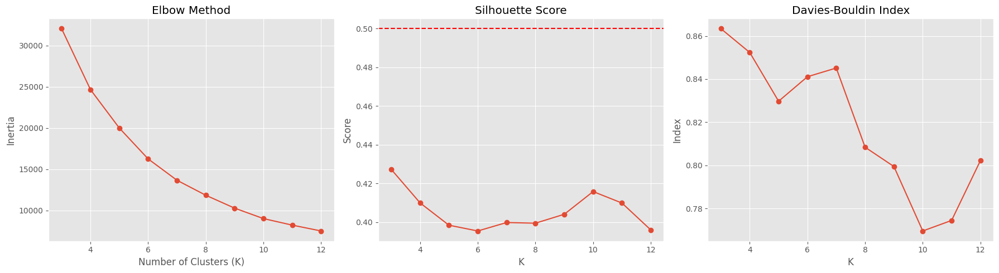

In [ ]:
plt.figure(figsize=(18,5))

plt.subplot(1,3,1)
plt.plot(list(k_range), inertia, marker='o')
plt.title("Elbow Method")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Inertia")

plt.subplot(1,3,2)
plt.plot(list(k_range), sil_scores, marker='o')
plt.axhline(0.5, color='red', linestyle='--')
plt.title("Silhouette Score")
plt.xlabel("K")
plt.ylabel("Score")

plt.subplot(1,3,3)
plt.plot(list(k_range), db_scores, marker='o')
plt.title("Davies-Bouldin Index")
plt.xlabel("K")
plt.ylabel("Index")

plt.tight_layout()
plt.savefig(RESULTS_PATH + "kmeans_validation_metrics.png", dpi=300)
plt.show()


In [ ]:
# FINAL K-MEANS HOTSPOT CLUSTERING (5–10 Zones)
BEST_K = 7

kmeans = KMeans(n_clusters=BEST_K, random_state=RANDOM_STATE, n_init=10)
df['KMeans_Cluster'] = kmeans.fit_predict(geo_features)

In [ ]:
import os
os.environ["PYDEVD_DISABLE_FILE_VALIDATION"] = "1"

In [ ]:
# DBSCAN – Natural Crime Hotspots (Noise Removal)
from sklearn.cluster import DBSCAN

dbscan_sample = geo_features.sample(
    n=100000,
    random_state=RANDOM_STATE
)

dbscan = DBSCAN(eps=0.15, min_samples=50)
df.loc[dbscan_sample.index, 'DBSCAN_Cluster'] = dbscan.fit_predict(dbscan_sample)


In [ ]:

# dbscan = DBSCAN(
#     eps=0.15,
#     min_samples=50,
#     metric='euclidean'
# )

# df['DBSCAN_Cluster'] = dbscan.fit_predict(geo_features)

In [ ]:
# Hierarchical Clustering (Structure Understanding)
from sklearn.cluster import AgglomerativeClustering

hier_sample = geo_features.sample(
    n=min(HIERARCHICAL_SAMPLE, len(df)),
    random_state=RANDOM_STATE
)

hier = AgglomerativeClustering(n_clusters=6, linkage='ward')
df.loc[hier_sample.index, 'Hier_Cluster'] = hier.fit_predict(hier_sample)

In [ ]:
# Cluster Analytics (VERY IMPORTANT FOR INTERVIEW)
def cluster_summary(df, cluster_col):
    summary = df.groupby(cluster_col).agg(
        total_crimes=('ID', 'count'),
        arrest_rate=('Arrest', 'mean'),
        dominant_crime=('Primary Type', lambda x: x.value_counts().idxmax())
    ).reset_index()
    return summary

kmeans_summary = cluster_summary(df, 'KMeans_Cluster')
dbscan_summary = cluster_summary(df[df['DBSCAN_Cluster'] != -1], 'DBSCAN_Cluster')

In [ ]:
kmeans_summary.to_csv(RESULTS_PATH + "kmeans_cluster_summary.csv", index=False)
dbscan_summary.to_csv(RESULTS_PATH + "dbscan_cluster_summary.csv", index=False)

In [ ]:
# Crime Risk Zones (Red / Yellow / Green)
cluster_risk = df.groupby('KMeans_Cluster')['Severity'].mean()

def risk_label(sev):
    if sev >= 3:
        return "High"
    elif sev >= 2:
        return "Medium"
    else:
        return "Low"

df['Risk_Zone'] = df['KMeans_Cluster'].map(cluster_risk).apply(risk_label)

In [ ]:
# Chicago Crime Heatmap (Interactive)
import plotly.express as px

fig = px.density_mapbox(
    df,
    lat='Latitude',
    lon='Longitude',
    z='Severity',
    radius=8,
    center=dict(lat=41.8781, lon=-87.6298),
    zoom=9,
    mapbox_style="carto-darkmatter",
    title="Chicago Crime Heatmap (Risk Zones)"
)

fig.write_html(RESULTS_PATH + "crime_heatmap.html")
fig.show()

In [ ]:
#Algorithm Comparison (FINAL DECISION)
comparison = pd.DataFrame({
    "Algorithm": ["KMeans", "DBSCAN"],
    "Silhouette": [
        silhouette_score(sample_df, df.loc[sample_df.index, 'KMeans_Cluster']),
        "N/A"
    ],
    "Usability": ["High (clear patrol zones)", "High (natural hotspots)"]
})

comparison.to_csv(RESULTS_PATH + "algorithm_comparison.csv", index=False)
comparison

,Algorithm,Silhouette,Usability
0,KMeans,0.398762,High (clear patrol zones)
1,DBSCAN,N/A,High (natural hotspots)


In [ ]:
# Temporal Pattern Clustering (3–5 Patterns)
time_features = df[['Hour', 'DayOfWeek', 'Month']].copy()
time_features['DayOfWeek'] = df['DayOfWeek'].astype('category').cat.codes

scaler = StandardScaler()
time_scaled = scaler.fit_transform(time_features)

time_kmeans = KMeans(n_clusters=4, random_state=RANDOM_STATE)
df['Time_Cluster'] = time_kmeans.fit_predict(time_scaled)

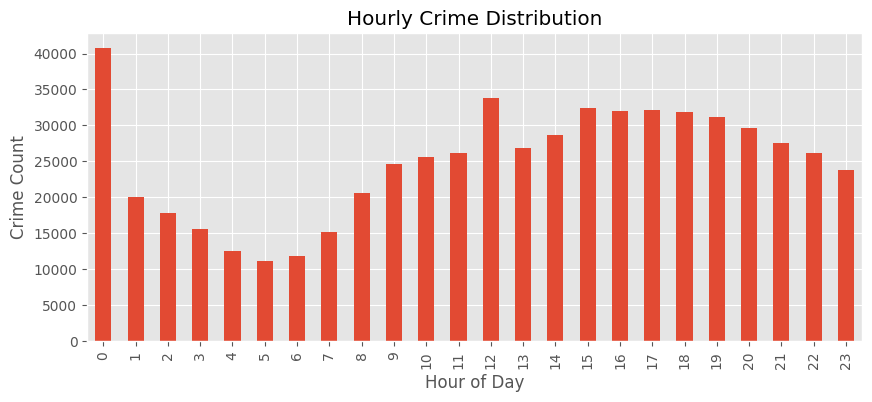

In [ ]:
# Peak Crime Times (10 PM – 2 AM)
hourly_counts = df.groupby('Hour').size()

plt.figure(figsize=(10,4))
hourly_counts.plot(kind='bar')
plt.title("Hourly Crime Distribution")
plt.xlabel("Hour of Day")
plt.ylabel("Crime Count")
plt.savefig(RESULTS_PATH + "hourly_crime_distribution.png", dpi=300)
plt.show()

In [ ]:
# Seasonal & Weekend Analysis
season_counts = df['Season'].value_counts()
weekend = df['DayOfWeek'].isin(['Saturday','Sunday'])

print("Weekend Crimes:", weekend.sum())
print("Weekday Crimes:", (~weekend).sum())


Weekend Crimes: 172826
Weekday Crimes: 424842


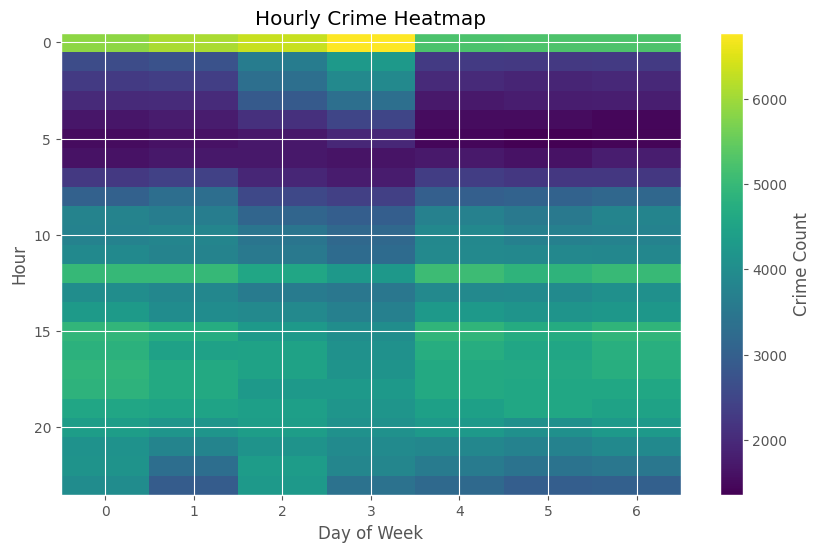

In [ ]:
# Hourly Heatmap (When Crimes Happen)
heatmap_data = pd.crosstab(df['Hour'], df['DayOfWeek'])

plt.figure(figsize=(10,6))
plt.imshow(heatmap_data, aspect='auto')
plt.colorbar(label='Crime Count')
plt.xlabel("Day of Week")
plt.ylabel("Hour")
plt.title("Hourly Crime Heatmap")
plt.savefig(RESULTS_PATH + "hourly_heatmap.png", dpi=300)
plt.show()

# Dimensionality Reduction Results

In [ ]:
from sklearn.preprocessing import StandardScaler

pca_features = df[
    [
        'Lat_norm', 'Lon_norm',
        'Hour', 'Day', 'Month',
        'Year',
        'Lat_bin', 'Lon_bin',
        'Severity',
        'Arrest'
    ]
].copy()

# Convert boolean to int
pca_features['Arrest'] = pca_features['Arrest'].astype(int)

# Standardize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(pca_features)

In [ ]:
# PCA
from sklearn.decomposition import PCA

pca = PCA()
X_pca = pca.fit_transform(X_scaled)

explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()

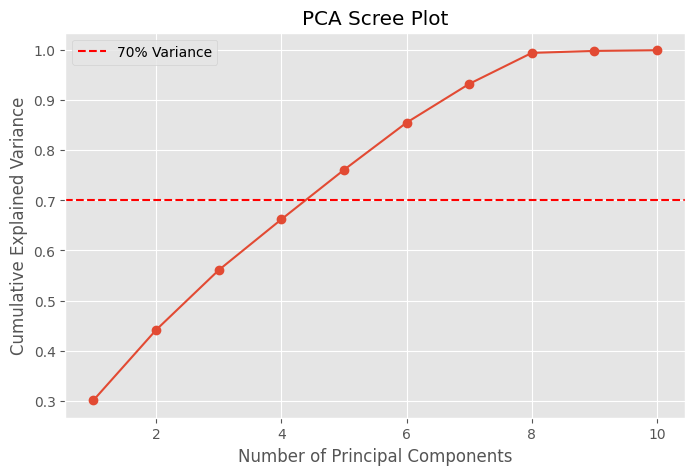

In [ ]:
plt.figure(figsize=(8,5))
plt.plot(
    range(1, len(explained_variance) + 1),
    cumulative_variance,
    marker='o'
)
plt.axhline(0.70, color='red', linestyle='--', label='70% Variance')
plt.xlabel("Number of Principal Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA Scree Plot")
plt.legend()
plt.grid(True)
plt.savefig(RESULTS_PATH + "pca_scree_plot.png", dpi=300)
plt.show()

In [ ]:
# PCA Feature Importance (Interpretability)
pca_2 = PCA(n_components=2)
X_pca_2 = pca_2.fit_transform(X_scaled)

pca_loadings = pd.DataFrame(
    pca_2.components_.T,
    columns=['PC1', 'PC2'],
    index=pca_features.columns
)

pca_loadings.sort_values(by='PC1', key=abs, ascending=False)

,PC1,PC2
Lat_bin,0.502967,-0.012831
Lat_norm,0.502183,-0.012149
Lon_norm,-0.498230,-0.008512
Lon_bin,-0.495150,-0.006059
Severity,-0.028159,-0.241063
Arrest,0.022387,0.249790
Year,-0.008457,0.666875
Hour,0.007572,0.039336
Month,0.002668,-0.656916
Day,-0.000787,-0.035549


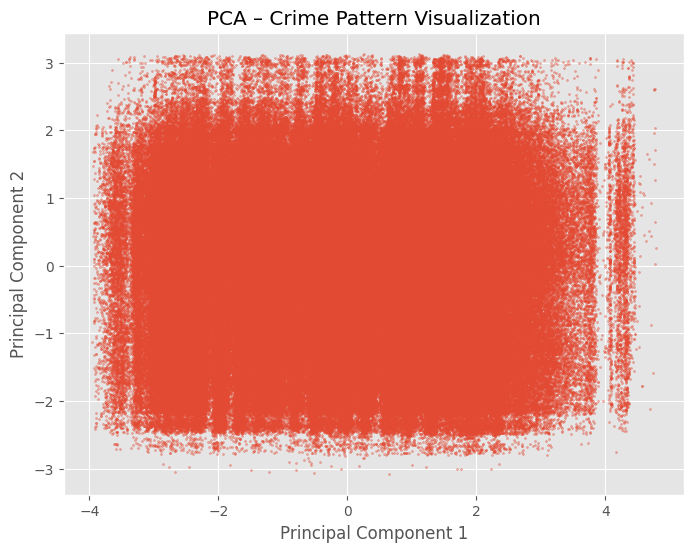

In [ ]:
# PCA 2D Scatter Plot
pca_df = pd.DataFrame(X_pca_2, columns=['PC1', 'PC2'])
pca_df['Primary Type'] = df['Primary Type'].values

plt.figure(figsize=(8,6))
plt.scatter(pca_df['PC1'], pca_df['PC2'], s=2, alpha=0.4)
plt.title("PCA – Crime Pattern Visualization")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.savefig(RESULTS_PATH + "pca_2d_scatter.png", dpi=300)
plt.show()

In [ ]:
# Sampling for t-SNE
TSNE_SAMPLE = 15000

tsne_sample = df.sample(
    n=min(TSNE_SAMPLE, len(df)),
    random_state=RANDOM_STATE
)

X_tsne = X_scaled[tsne_sample.index]

In [ ]:
# Run t-SNE
from sklearn.manifold import TSNE

tsne = TSNE(
    n_components=2,
    perplexity=30,
    n_iter=1000,
    random_state=RANDOM_STATE
)

X_tsne_2d = tsne.fit_transform(X_tsne)

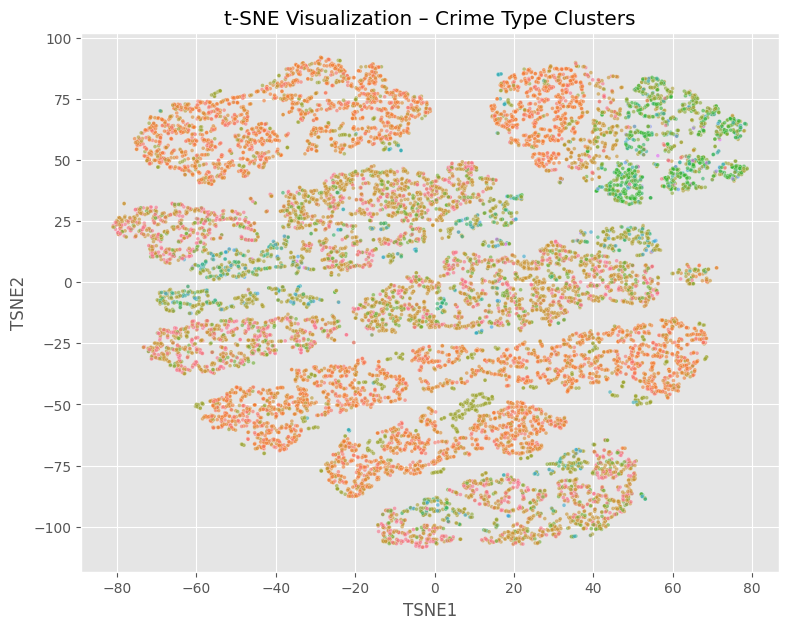

In [ ]:
# t-SNE Plot – Colored by Crime Type
tsne_df = pd.DataFrame(X_tsne_2d, columns=['TSNE1', 'TSNE2'])
tsne_df['Crime Type'] = tsne_sample['Primary Type'].values

plt.figure(figsize=(9,7))
sns.scatterplot(
    x='TSNE1',
    y='TSNE2',
    hue='Crime Type',
    data=tsne_df,
    legend=False,
    s=8,
    alpha=0.6
)
plt.title("t-SNE Visualization – Crime Type Clusters")
plt.savefig(RESULTS_PATH + "tsne_crime_type.png", dpi=300)
plt.show()

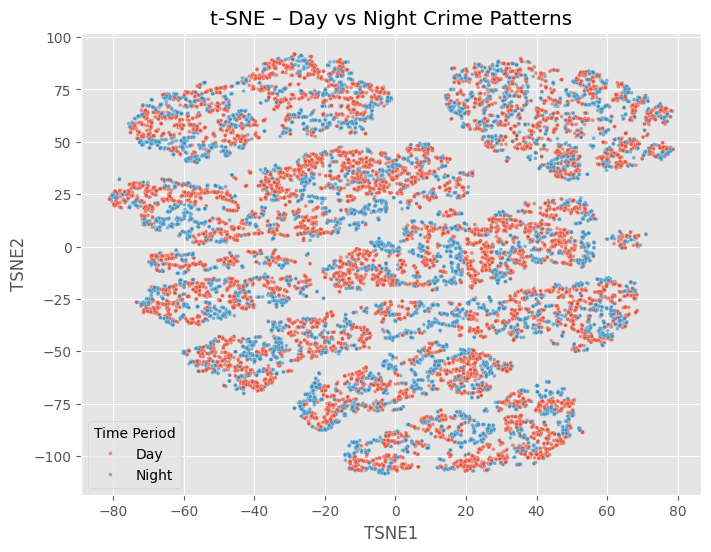

In [ ]:
# t-SNE Plot – Day vs Night Crimes
tsne_df['Time Period'] = np.where(
    tsne_sample['Hour'].between(6, 18),
    'Day',
    'Night'
)

plt.figure(figsize=(8,6))
sns.scatterplot(
    x='TSNE1',
    y='TSNE2',
    hue='Time Period',
    data=tsne_df,
    s=8,
    alpha=0.6
)
plt.title("t-SNE – Day vs Night Crime Patterns")
plt.savefig(RESULTS_PATH + "tsne_day_night.png", dpi=300)
plt.show()

In [ ]:
# Interactive t-SNE (Drill-Down Capability)
fig = px.scatter(
    tsne_df,
    x='TSNE1',
    y='TSNE2',
    color='Crime Type',
    title="Interactive t-SNE Crime Clusters",
    opacity=0.6
)

fig.write_html(RESULTS_PATH + "tsne_interactive.html")
# fig.show()  # optional

# pca tsna

In [ ]:

import plotly.express as px
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Silence Colab debugger noise
os.environ["PYDEVD_DISABLE_FILE_VALIDATION"] = "1"

BASE_PATH = "/content/drive/MyDrive/Malay_folder/guvi/"
RESULTS_PATH = BASE_PATH + "results/"
DATA_PATH = BASE_PATH + "data/"
os.makedirs(RESULTS_PATH, exist_ok=True)
os.makedirs(DATA_PATH, exist_ok=True)

RANDOM_STATE = 42


In [ ]:
# Ensure Date is datetime
if not pd.api.types.is_datetime64_any_dtype(df['Date']):
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# Temporal features
df['Hour'] = df['Date'].dt.hour
df['DayOfWeek'] = df['Date'].dt.dayofweek   # 0=Mon
df['Month'] = df['Date'].dt.month
df['IsWeekend'] = df['DayOfWeek'].isin([5,6]).astype(int)

# Severity fallback (if not already created)
if 'Severity' not in df.columns:
    df['Severity'] = df['Primary Type'].map({
        "HOMICIDE":5,"CRIM SEXUAL ASSAULT":4,"ROBBERY":4,"BATTERY":3,"ASSAULT":3,
        "BURGLARY":3,"MOTOR VEHICLE THEFT":3,"THEFT":2,
        "CRIMINAL DAMAGE":2,"DECEPTIVE PRACTICE":2
    }).fillna(1)

# Normalized geo
if 'Lat_norm' not in df.columns or 'Lon_norm' not in df.columns:
    scaler_pos = StandardScaler()
    df[['Lat_norm','Lon_norm']] = scaler_pos.fit_transform(
        df[['Latitude','Longitude']]
    )


In [ ]:
numeric_features = [
    'Hour', 'DayOfWeek', 'Month', 'IsWeekend',
    'Lat_norm', 'Lon_norm',
    'Severity'
]

X_num = df[numeric_features].fillna(0)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_num)


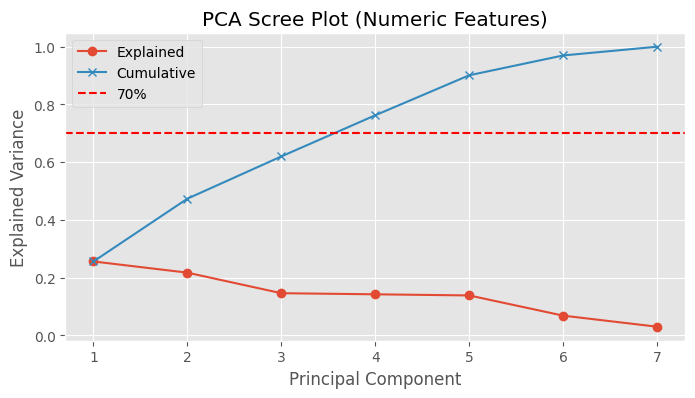

Components needed for ~70% variance: 4


In [ ]:
pca = PCA(n_components=min(10, X_scaled.shape[1]), random_state=RANDOM_STATE)
pca.fit(X_scaled)

explained = pca.explained_variance_ratio_
cum_explained = np.cumsum(explained)

# Scree plot
plt.figure(figsize=(8,4))
plt.plot(range(1,len(explained)+1), explained, marker='o', label='Explained')
plt.plot(range(1,len(explained)+1), cum_explained, marker='x', label='Cumulative')
plt.axhline(0.70, color='red', linestyle='--', label='70%')
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance")
plt.title("PCA Scree Plot (Numeric Features)")
plt.legend()
plt.grid(True)
plt.savefig(RESULTS_PATH + "pca_scree_plot.png", dpi=300)
plt.show()

n_keep = np.searchsorted(cum_explained, 0.70) + 1
print("Components needed for ~70% variance:", n_keep)


In [ ]:
n_comp = max(2, min(3, n_keep))
pca2 = PCA(n_components=n_comp, random_state=RANDOM_STATE)
X_pca = pca2.fit_transform(X_scaled)

# Loadings
loadings = pd.DataFrame(
    pca2.components_.T,
    index=numeric_features,
    columns=[f'PC{i+1}' for i in range(n_comp)]
)

loadings['abs_sum'] = loadings.abs().sum(axis=1)
loadings_sorted = loadings.sort_values('abs_sum', ascending=False)

loadings_sorted.to_csv(
    RESULTS_PATH + "pca_feature_loadings.csv"
)

display(loadings_sorted)


,PC1,PC2,PC3,abs_sum
Severity,0.050646,-0.075609,0.675321,0.801576
Month,0.027911,-0.000719,0.729560,0.758191
DayOfWeek,0.704179,-0.007665,-0.045935,0.757779
Lat_norm,0.014590,0.705226,0.035292,0.755108
IsWeekend,0.704938,-0.010893,-0.038982,0.754814
Lon_norm,-0.011053,-0.704546,-0.038795,0.754393
Hour,-0.059288,0.019403,-0.072826,0.151518


In [ ]:
pca_df = pd.DataFrame(
    X_pca,
    columns=[f'PC{i+1}' for i in range(n_comp)]
)

pca_df = pd.concat(
    [pca_df, df[['Primary Type','Latitude','Longitude','Severity']]],
    axis=1
)

pca_df.to_csv(RESULTS_PATH + "pca_transformed_data.csv", index=False)


In [ ]:
pca_plot = pca_df.sample(n=50000, random_state=RANDOM_STATE)

fig = px.scatter(
    pca_plot,
    x='PC1', y='PC2',
    color='Primary Type',
    title='PCA 2D Crime Pattern (Sample)'
)
fig.write_html(RESULTS_PATH + "pca_2d_interactive.html")
# fig.show()


In [ ]:
SAMPLE_EMBED = 100000
embed_sample = df.sample(n=min(SAMPLE_EMBED, len(df)), random_state=RANDOM_STATE)

# One-hot encode Primary Type
enc = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
ohe = enc.fit_transform(embed_sample[['Primary Type']])

embed_X = np.hstack([
    embed_sample[numeric_features].fillna(0).values,
    ohe
])

embed_X = StandardScaler().fit_transform(embed_X)


In [ ]:
try:
    import umap
    reducer = umap.UMAP(
        n_components=2,
        n_neighbors=15,
        min_dist=0.1,
        random_state=RANDOM_STATE
    )
    embedding = reducer.fit_transform(embed_X)
    method = "UMAP"
except:
    tsne = TSNE(
        n_components=2,
        perplexity=30,
        init='pca',
        random_state=RANDOM_STATE
    )
    embedding = tsne.fit_transform(embed_X)
    method = "t-SNE"

embed_df = pd.DataFrame(embedding, columns=['Dim1','Dim2'])
embed_df = pd.concat(
    [embed_df, embed_sample[['Primary Type','Severity','Latitude','Longitude']]],
    axis=1
)

embed_df.to_csv(RESULTS_PATH + f"{method.lower()}_embedding.csv", index=False)


In [ ]:
fig1 = px.scatter(
    embed_df.sample(n=40000, random_state=RANDOM_STATE),
    x='Dim1', y='Dim2',
    color='Primary Type',
    title=f"{method} – Crime Type Clustering"
)
fig1.write_html(RESULTS_PATH + f"{method.lower()}_crime_type.html")

fig2 = px.scatter(
    embed_df.sample(n=40000, random_state=RANDOM_STATE),
    x='Dim1', y='Dim2',
    color='Severity',
    title=f"{method} – Severity Patterns"
)
fig2.write_html(RESULTS_PATH + f"{method.lower()}_severity.html")


# new one

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Silence Colab debugger noise
os.environ["PYDEVD_DISABLE_FILE_VALIDATION"] = "1"

BASE_PATH = "/content/drive/MyDrive/Malay_folder/guvi/"
RESULTS_PATH = BASE_PATH + "results/"
DATA_PATH = BASE_PATH + "data/"
os.makedirs(RESULTS_PATH, exist_ok=True)
os.makedirs(DATA_PATH, exist_ok=True)

RANDOM_STATE = 42


In [ ]:
# Ensure Date is datetime
if not pd.api.types.is_datetime64_any_dtype(df['Date']):
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# Temporal features
df['Hour'] = df['Date'].dt.hour
df['DayOfWeek'] = df['Date'].dt.dayofweek   # 0=Mon
df['Month'] = df['Date'].dt.month
df['IsWeekend'] = df['DayOfWeek'].isin([5,6]).astype(int)

# Severity fallback (if not already created)
if 'Severity' not in df.columns:
    df['Severity'] = df['Primary Type'].map({
        "HOMICIDE":5,"CRIM SEXUAL ASSAULT":4,"ROBBERY":4,"BATTERY":3,"ASSAULT":3,
        "BURGLARY":3,"MOTOR VEHICLE THEFT":3,"THEFT":2,
        "CRIMINAL DAMAGE":2,"DECEPTIVE PRACTICE":2
    }).fillna(1)

# Normalized geo
if 'Lat_norm' not in df.columns or 'Lon_norm' not in df.columns:
    scaler_pos = StandardScaler()
    df[['Lat_norm','Lon_norm']] = scaler_pos.fit_transform(
        df[['Latitude','Longitude']]
    )


In [ ]:
numeric_features = [
    'Hour', 'DayOfWeek', 'Month', 'IsWeekend',
    'Lat_norm', 'Lon_norm',
    'Severity'
]

X_num = df[numeric_features].fillna(0)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_num)


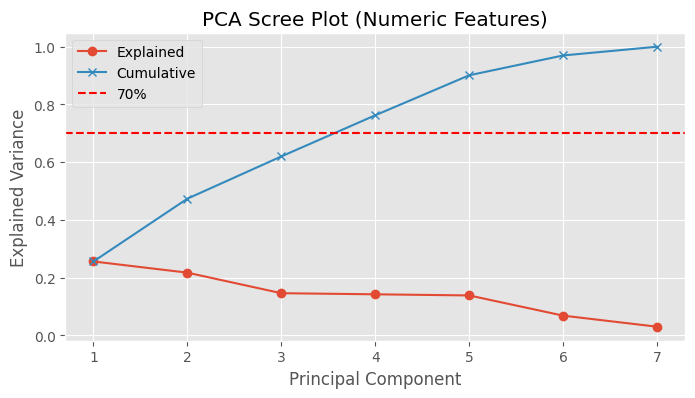

Components needed for ~70% variance: 4


In [ ]:
pca = PCA(n_components=min(10, X_scaled.shape[1]), random_state=RANDOM_STATE)
pca.fit(X_scaled)

explained = pca.explained_variance_ratio_
cum_explained = np.cumsum(explained)

# Scree plot
plt.figure(figsize=(8,4))
plt.plot(range(1,len(explained)+1), explained, marker='o', label='Explained')
plt.plot(range(1,len(explained)+1), cum_explained, marker='x', label='Cumulative')
plt.axhline(0.70, color='red', linestyle='--', label='70%')
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance")
plt.title("PCA Scree Plot (Numeric Features)")
plt.legend()
plt.grid(True)
plt.savefig(RESULTS_PATH + "pca_scree_plot.png", dpi=300)
plt.show()

n_keep = np.searchsorted(cum_explained, 0.70) + 1
print("Components needed for ~70% variance:", n_keep)


In [ ]:
n_comp = max(2, min(3, n_keep))
pca2 = PCA(n_components=n_comp, random_state=RANDOM_STATE)
X_pca = pca2.fit_transform(X_scaled)

# Loadings
loadings = pd.DataFrame(
    pca2.components_.T,
    index=numeric_features,
    columns=[f'PC{i+1}' for i in range(n_comp)]
)

loadings['abs_sum'] = loadings.abs().sum(axis=1)
loadings_sorted = loadings.sort_values('abs_sum', ascending=False)

loadings_sorted.to_csv(
    RESULTS_PATH + "pca_feature_loadings.csv"
)

display(loadings_sorted)


,PC1,PC2,PC3,abs_sum
Severity,0.050646,-0.075609,0.675321,0.801576
Month,0.027911,-0.000719,0.729560,0.758191
DayOfWeek,0.704179,-0.007665,-0.045935,0.757779
Lat_norm,0.014590,0.705226,0.035292,0.755108
IsWeekend,0.704938,-0.010893,-0.038982,0.754814
Lon_norm,-0.011053,-0.704546,-0.038795,0.754393
Hour,-0.059288,0.019403,-0.072826,0.151518


In [ ]:
n_comp = max(2, min(3, n_keep))
pca2 = PCA(n_components=n_comp, random_state=RANDOM_STATE)
X_pca = pca2.fit_transform(X_scaled)

# Loadings
loadings = pd.DataFrame(
    pca2.components_.T,
    index=numeric_features,
    columns=[f'PC{i+1}' for i in range(n_comp)]
)

loadings['abs_sum'] = loadings.abs().sum(axis=1)
loadings_sorted = loadings.sort_values('abs_sum', ascending=False)

loadings_sorted.to_csv(
    RESULTS_PATH + "pca_feature_loadings.csv"
)

display(loadings_sorted)


,PC1,PC2,PC3,abs_sum
Severity,0.050646,-0.075609,0.675321,0.801576
Month,0.027911,-0.000719,0.729560,0.758191
DayOfWeek,0.704179,-0.007665,-0.045935,0.757779
Lat_norm,0.014590,0.705226,0.035292,0.755108
IsWeekend,0.704938,-0.010893,-0.038982,0.754814
Lon_norm,-0.011053,-0.704546,-0.038795,0.754393
Hour,-0.059288,0.019403,-0.072826,0.151518


In [ ]:
pca_df = pd.DataFrame(
    X_pca,
    columns=[f'PC{i+1}' for i in range(n_comp)]
)

pca_df = pd.concat(
    [pca_df, df[['Primary Type','Latitude','Longitude','Severity']]],
    axis=1
)

pca_df.to_csv(RESULTS_PATH + "pca_transformed_data.csv", index=False)


In [ ]:
pca_plot = pca_df.sample(n=50000, random_state=RANDOM_STATE)

fig = px.scatter(
    pca_plot,
    x='PC1', y='PC2',
    color='Primary Type',
    title='PCA 2D Crime Pattern (Sample)'
)
fig.write_html(RESULTS_PATH + "pca_2d_interactive.html")
# fig.show()


In [ ]:
SAMPLE_EMBED = 100000
embed_sample = df.sample(n=min(SAMPLE_EMBED, len(df)), random_state=RANDOM_STATE)

# One-hot encode Primary Type
enc = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
ohe = enc.fit_transform(embed_sample[['Primary Type']])

embed_X = np.hstack([
    embed_sample[numeric_features].fillna(0).values,
    ohe
])

embed_X = StandardScaler().fit_transform(embed_X)


In [ ]:
try:
    import umap
    reducer = umap.UMAP(
        n_components=2,
        n_neighbors=15,
        min_dist=0.1,
        random_state=RANDOM_STATE
    )
    embedding = reducer.fit_transform(embed_X)
    method = "UMAP"
except:
    tsne = TSNE(
        n_components=2,
        perplexity=30,
        init='pca',
        random_state=RANDOM_STATE
    )
    embedding = tsne.fit_transform(embed_X)
    method = "t-SNE"

embed_df = pd.DataFrame(embedding, columns=['Dim1','Dim2'])
embed_df = pd.concat(
    [embed_df, embed_sample[['Primary Type','Severity','Latitude','Longitude']]],
    axis=1
)

embed_df.to_csv(RESULTS_PATH + f"{method.lower()}_embedding.csv", index=False)


In [ ]:
fig1 = px.scatter(
    embed_df.sample(n=40000, random_state=RANDOM_STATE),
    x='Dim1', y='Dim2',
    color='Primary Type',
    title=f"{method} – Crime Type Clustering"
)
fig1.write_html(RESULTS_PATH + f"{method.lower()}_crime_type.html")

fig2 = px.scatter(
    embed_df.sample(n=40000, random_state=RANDOM_STATE),
    x='Dim1', y='Dim2',
    color='Severity',
    title=f"{method} – Severity Patterns"
)
fig2.write_html(RESULTS_PATH + f"{method.lower()}_severity.html")


In [ ]:
!pip install -q kaleido


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.0/69.0 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.3/49.3 kB 1.8 MB/s eta 0:00:00
